In [70]:
import numpy as np
import pandas as pd
import gc
import time
import matplotlib.pyplot as plt
import seaborn as sns
from contextlib import contextmanager
import importlib
import missingno as msno
import warnings
warnings.filterwarnings('ignore')
import missingno as msno

# Description des dataset


**application_{train|test}.csv :**

Contient les détails des demandes de prêt, divisées en fichiers pour l'entraînement et le test.

**bureau.csv :**

Fournit des informations sur les crédits antérieurs des clients provenant d'autres institutions financières.

**bureau_balance.csv :**

Comprend les soldes mensuels des crédits antérieurs au bureau de crédit.

**POS_CASH_balance.csv :**

 Donne des instantanés mensuels des soldes des points de vente précédents et des prêts en espèces contractés avec Home Credit

**credit_card_balance.csv :**

 Présente les soldes mensuels des cartes de crédit précédentes des clients.

**application_précédente.csv :**

Contient des détails sur les demandes de prêt immobilier précédentes des clients.

**versements_paiements.csv :**

Fournit l'historique des remboursements des crédits précédemment décaissés.

**AccueilCredit_columns_description.csv :**

Descriptions des colonnes des différents fichiers de données.

Voici les différentes tables ainsi que leurs clés:


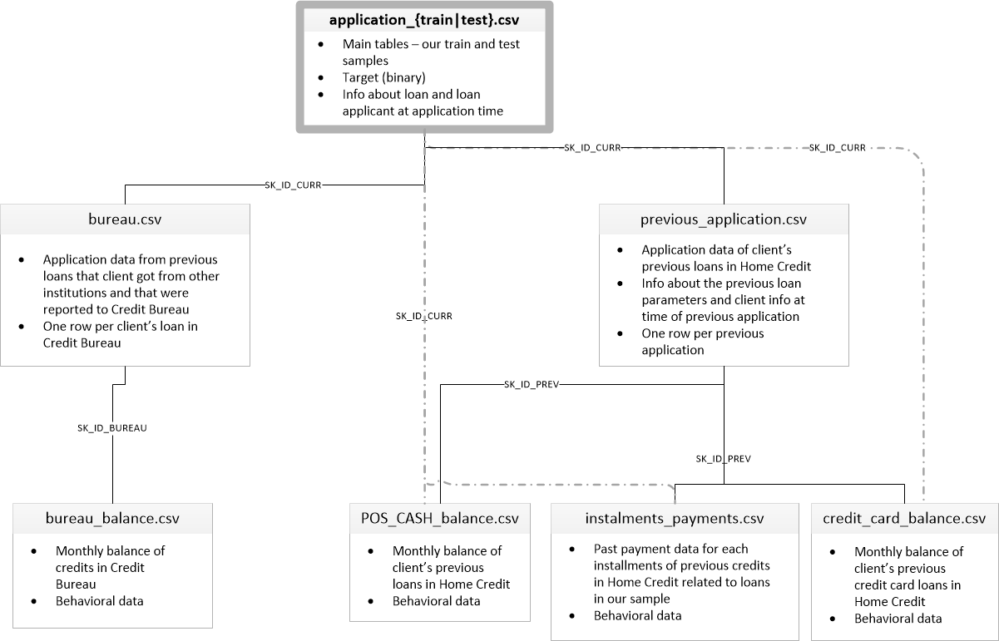

# Préparation des données et feature engineering

Afin de faciliter l’analyse exploratoire, la préparation des données et le feature engineering nécessaires à l’élaboration du modèle de scoring, nous nous basons sur un kernel Kaggle : https://www.kaggle.com/code/jsaguiar/lightgbm-with-simple-features/script

In [71]:
@contextmanager
def timer(title):
    '''Fonction calculant le temps d'éxécution d'autres fonctions.
    Keyword arguments:
    title -- titre de la fonction exécutée.
    '''
    t0 = time.time()
    yield
    print("{} - réalisé en {:.0f}s".format(title, time.time() - t0))
    
# One-hot encoding for categorical columns with get_dummies
def one_hot_encoder(df, nan_as_category = True):
    '''Encodage des variables catégorielles.
    Keyword arguments:
    df -- dataframe
    nan_as_category -- ajout d'une colonne indiquant les NaN (default True)
    Returns:
    df -- dataframe encodé
    new_columns -- nouvelles colonnes créées par l'encodage.
    '''
    original_columns = list(df.columns)
    categorical_columns = [col for col in df.columns if df[col].dtype == 'object']
    df = pd.get_dummies(df, columns= categorical_columns, dummy_na= nan_as_category, dtype=int)
    new_columns = [c for c in df.columns if c not in original_columns]
    
    return df, new_columns

# Preprocess application_train.csv and application_test.csv
def application_train_test(num_rows = None, nan_as_category = False):
    '''Preprocessing de application_train.csv et application_test.csv.
    Keyword arguments:
    num_rows -- nombre de lignes (default None)
    nan_as_category -- ajout d'une colonne indiquant les NaN (default False)
    Returns:
    df -- dataframe mergé et preprocessing réalisé.
    '''
    # Read data and merge
    df = pd.read_csv('application_train.csv', nrows= num_rows)
    test_df = pd.read_csv('application_test.csv', nrows= num_rows)
    print("Taille des données d'entrainement: {}, Taille des données de test: {}".format(len(df), len(test_df)))
    df = pd.concat([df,test_df], ignore_index=True)
    # Optional: Remove 4 applications with XNA CODE_GENDER (train set)
    df = df[df['CODE_GENDER'] != 'XNA']
    
    # Categorical features with Binary encode (0 or 1; two categories)
    for bin_feature in ['CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY']:
        df[bin_feature], uniques = pd.factorize(df[bin_feature])
    # Categorical features with One-Hot encode
    df, cat_cols = one_hot_encoder(df, nan_as_category)
    
    # NaN values for DAYS_EMPLOYED: 365.243 -> nan
    df['DAYS_EMPLOYED'].replace(365243, np.nan, inplace= True)
    # Some simple new features (percentages)
    df['DAYS_EMPLOYED_PERC'] = df['DAYS_EMPLOYED'] / df['DAYS_BIRTH']
    df['INCOME_CREDIT_PERC'] = df['AMT_INCOME_TOTAL'] / df['AMT_CREDIT']
    df['INCOME_PER_PERSON'] = df['AMT_INCOME_TOTAL'] / df['CNT_FAM_MEMBERS']
    df['ANNUITY_INCOME_PERC'] = df['AMT_ANNUITY'] / df['AMT_INCOME_TOTAL']
    df['PAYMENT_RATE'] = df['AMT_ANNUITY'] / df['AMT_CREDIT']

    del test_df
    gc.collect()
    
    return df

# Preprocess bureau.csv and bureau_balance.csv

def bureau_and_balance(num_rows = None, nan_as_category = True):
    '''Preprocessing de bureau.csv et bureau_balance.csv.
    Keyword arguments:
    num_rows -- nombre de lignes (default None)
    nan_as_category -- ajout d'une colonne indiquant les NaN (default True)
    Returns:
    bureau_agg -- dataframe aggregé et preprocessing réalisé.
    '''
    bureau = pd.read_csv('bureau.csv', nrows = num_rows)
    bb = pd.read_csv('bureau_balance.csv', nrows = num_rows)
    bb, bb_cat = one_hot_encoder(bb, nan_as_category)
    bureau, bureau_cat = one_hot_encoder(bureau, nan_as_category)
    
    # Bureau balance: Perform aggregations and merge with bureau.csv
    bb_aggregations = {'MONTHS_BALANCE': ['min', 'max', 'size']}
    for col in bb_cat:
        bb_aggregations[col] = ['mean']
    bb_agg = bb.groupby('SK_ID_BUREAU').agg(bb_aggregations)
    bb_agg.columns = pd.Index([e[0] + "_" + e[1].upper() for e in bb_agg.columns.tolist()])
    bureau = bureau.join(bb_agg, how='left', on='SK_ID_BUREAU')
    bureau.drop(['SK_ID_BUREAU'], axis=1, inplace= True)
    del bb, bb_agg
    gc.collect()
    
    # Bureau and bureau_balance numeric features
    num_aggregations = {
        'DAYS_CREDIT': ['min', 'max', 'mean', 'var'],
        'DAYS_CREDIT_ENDDATE': ['min', 'max', 'mean'],
        'DAYS_CREDIT_UPDATE': ['mean'],
        'CREDIT_DAY_OVERDUE': ['max', 'mean'],
        'AMT_CREDIT_MAX_OVERDUE': ['mean'],
        'AMT_CREDIT_SUM': ['max', 'mean', 'sum'],
        'AMT_CREDIT_SUM_DEBT': ['max', 'mean', 'sum'],
        'AMT_CREDIT_SUM_OVERDUE': ['mean'],
        'AMT_CREDIT_SUM_LIMIT': ['mean', 'sum'],
        'AMT_ANNUITY': ['max', 'mean'],
        'CNT_CREDIT_PROLONG': ['sum'],
        'MONTHS_BALANCE_MIN': ['min'],
        'MONTHS_BALANCE_MAX': ['max'],
        'MONTHS_BALANCE_SIZE': ['mean', 'sum']
    }
    # Bureau and bureau_balance categorical features
    cat_aggregations = {}
    for cat in bureau_cat: cat_aggregations[cat] = ['mean']
    for cat in bb_cat: cat_aggregations[cat + "_MEAN"] = ['mean']
    
    bureau_agg = bureau.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    bureau_agg.columns = pd.Index(['BURO_' + e[0] + "_" + e[1].upper() for e in bureau_agg.columns.tolist()])
    
    # Bureau: Active credits - using only numerical aggregations
    active = bureau[bureau['CREDIT_ACTIVE_Active'] == 1]
    active_agg = active.groupby('SK_ID_CURR').agg(num_aggregations)
    active_agg.columns = pd.Index(['ACTIVE_' + e[0] + "_" + e[1].upper() for e in active_agg.columns.tolist()])
    bureau_agg = bureau_agg.join(active_agg, how='left', on='SK_ID_CURR')
    del active, active_agg
    gc.collect()
    
    # Bureau: Closed credits - using only numerical aggregations
    closed = bureau[bureau['CREDIT_ACTIVE_Closed'] == 1]
    closed_agg = closed.groupby('SK_ID_CURR').agg(num_aggregations)
    closed_agg.columns = pd.Index(['CLOSED_' + e[0] + "_" + e[1].upper() for e in closed_agg.columns.tolist()])
    bureau_agg = bureau_agg.join(closed_agg, how='left', on='SK_ID_CURR')
    del closed, closed_agg, bureau
    gc.collect()
    
    return bureau_agg

# Preprocess previous_applications.csv
def previous_applications(num_rows = None, nan_as_category = True):
    '''Preprocessing de previous_applications.csv.
    Keyword arguments:
    num_rows -- nombre de lignes (default None)
    nan_as_category -- ajout d'une colonne indiquant les NaN (default True)
    Returns:
    prev_agg -- dataframe aggregé et preprocessing réalisé.
    '''
    prev = pd.read_csv('previous_application.csv', nrows = num_rows)
    prev, cat_cols = one_hot_encoder(prev, nan_as_category= True)
    # Days 365.243 values -> nan
    prev['DAYS_FIRST_DRAWING'].replace(365243, np.nan, inplace= True)
    prev['DAYS_FIRST_DUE'].replace(365243, np.nan, inplace= True)
    prev['DAYS_LAST_DUE_1ST_VERSION'].replace(365243, np.nan, inplace= True)
    prev['DAYS_LAST_DUE'].replace(365243, np.nan, inplace= True)
    prev['DAYS_TERMINATION'].replace(365243, np.nan, inplace= True)
    # Add feature: value ask / value received percentage
    prev['APP_CREDIT_PERC'] = prev['AMT_APPLICATION'] / prev['AMT_CREDIT']
    
    # Previous applications numeric features
    num_aggregations = {
        'AMT_ANNUITY': ['min', 'max', 'mean'],
        'AMT_APPLICATION': ['min', 'max', 'mean'],
        'AMT_CREDIT': ['min', 'max', 'mean'],
        'APP_CREDIT_PERC': ['min', 'max', 'mean', 'var'],
        'AMT_DOWN_PAYMENT': ['min', 'max', 'mean'],
        'AMT_GOODS_PRICE': ['min', 'max', 'mean'],
        'HOUR_APPR_PROCESS_START': ['min', 'max', 'mean'],
        'RATE_DOWN_PAYMENT': ['min', 'max', 'mean'],
        'DAYS_DECISION': ['min', 'max', 'mean'],
        'CNT_PAYMENT': ['mean', 'sum'],
    }
    # Previous applications categorical features
    cat_aggregations = {}
    for cat in cat_cols:
        cat_aggregations[cat] = ['mean']
    
    prev_agg = prev.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    prev_agg.columns = pd.Index(['PREV_' + e[0] + "_" + e[1].upper() for e in prev_agg.columns.tolist()])
    
    # Previous Applications: Approved Applications - only numerical features
    approved = prev[prev['NAME_CONTRACT_STATUS_Approved'] == 1]
    approved_agg = approved.groupby('SK_ID_CURR').agg(num_aggregations)
    approved_agg.columns = pd.Index(['APPROVED_' + e[0] + "_" + e[1].upper() for e in approved_agg.columns.tolist()])
    prev_agg = prev_agg.join(approved_agg, how='left', on='SK_ID_CURR')
    
    # Previous Applications: Refused Applications - only numerical features
    refused = prev[prev['NAME_CONTRACT_STATUS_Refused'] == 1]
    refused_agg = refused.groupby('SK_ID_CURR').agg(num_aggregations)
    refused_agg.columns = pd.Index(['REFUSED_' + e[0] + "_" + e[1].upper() for e in refused_agg.columns.tolist()])
    prev_agg = prev_agg.join(refused_agg, how='left', on='SK_ID_CURR')
    del refused, refused_agg, approved, approved_agg, prev
    gc.collect()
    
    return prev_agg

# Preprocess POS_CASH_balance.csv

def pos_cash(num_rows = None, nan_as_category = True):
    '''Preprocessing de POS_CASH_balance.csv.
    Keyword arguments:
    num_rows -- nombre de lignes (default None)
    nan_as_category -- ajout d'une colonne indiquant les NaN (default True)
    Returns:
    pos_agg -- dataframe aggregé et preprocessing réalisé.
    '''
    pos = pd.read_csv('POS_CASH_balance.csv', nrows = num_rows)
    pos, cat_cols = one_hot_encoder(pos, nan_as_category= True)
    
    # Features
    aggregations = {
        'MONTHS_BALANCE': ['max', 'mean', 'size'],
        'SK_DPD': ['max', 'mean'],
        'SK_DPD_DEF': ['max', 'mean']
    }
    for cat in cat_cols:
        aggregations[cat] = ['mean']
    
    pos_agg = pos.groupby('SK_ID_CURR').agg(aggregations)
    pos_agg.columns = pd.Index(['POS_' + e[0] + "_" + e[1].upper() for e in pos_agg.columns.tolist()])
    # Count pos cash accounts
    pos_agg['POS_COUNT'] = pos.groupby('SK_ID_CURR').size()
    del pos
    gc.collect()
    
    return pos_agg
 # Preprocess installments_payments.csv
def installments_payments(num_rows = None, nan_as_category = True):
    '''Preprocessing de installments_payments.csv.
    Keyword arguments:
    num_rows -- nombre de lignes (default None)
    nan_as_category -- ajout d'une colonne indiquant les NaN (default True)
    Returns:
    ins_agg -- dataframe aggregé et preprocessing réalisé.
    '''
    ins = pd.read_csv('installments_payments.csv', nrows = num_rows)
    ins, cat_cols = one_hot_encoder(ins, nan_as_category= True)
    
    # Percentage and difference paid in each installment (amount paid and installment value)
    ins['PAYMENT_PERC'] = ins['AMT_PAYMENT'] / ins['AMT_INSTALMENT']
    ins['PAYMENT_DIFF'] = ins['AMT_INSTALMENT'] - ins['AMT_PAYMENT']
    # Days past due and days before due (no negative values)
    ins['DPD'] = ins['DAYS_ENTRY_PAYMENT'] - ins['DAYS_INSTALMENT']
    ins['DBD'] = ins['DAYS_INSTALMENT'] - ins['DAYS_ENTRY_PAYMENT']
    ins['DPD'] = ins['DPD'].apply(lambda x: x if x > 0 else 0)
    ins['DBD'] = ins['DBD'].apply(lambda x: x if x > 0 else 0)
    
    # Features: Perform aggregations
    aggregations = {
        'NUM_INSTALMENT_VERSION': ['nunique'],
        'DPD': ['max', 'mean', 'sum'],
        'DBD': ['max', 'mean', 'sum'],
        'PAYMENT_PERC': ['max', 'mean', 'sum', 'var'],
        'PAYMENT_DIFF': ['max', 'mean', 'sum', 'var'],
        'AMT_INSTALMENT': ['max', 'mean', 'sum'],
        'AMT_PAYMENT': ['min', 'max', 'mean', 'sum'],
        'DAYS_ENTRY_PAYMENT': ['max', 'mean', 'sum']
    }
    for cat in cat_cols:
        aggregations[cat] = ['mean']
    ins_agg = ins.groupby('SK_ID_CURR').agg(aggregations)
    ins_agg.columns = pd.Index(['INSTAL_' + e[0] + "_" + e[1].upper() for e in ins_agg.columns.tolist()])
    # Count installments accounts
    ins_agg['INSTAL_COUNT'] = ins.groupby('SK_ID_CURR').size()
    del ins
    gc.collect()
    
    return ins_agg

# Preprocess credit_card_balance.csv
def credit_card_balance(num_rows = None, nan_as_category = True):
    '''Preprocessing de credit_card_balance.csv.
    Keyword arguments:
    num_rows -- nombre de lignes (default None)
    nan_as_category -- ajout d'une colonne indiquant les NaN (default True)
    Returns:
    cc_agg -- dataframe aggregé et preprocessing réalisé.
    '''
    cc = pd.read_csv('credit_card_balance.csv', nrows = num_rows)
    cc, cat_cols = one_hot_encoder(cc, nan_as_category= True)
    
    # General aggregations
    cc.drop(['SK_ID_PREV'], axis= 1, inplace = True)
    cc_agg = cc.groupby('SK_ID_CURR').agg(['min', 'max', 'mean', 'sum', 'var'])
    cc_agg.columns = pd.Index(['CC_' + e[0] + "_" + e[1].upper() for e in cc_agg.columns.tolist()])
    # Count credit card lines
    cc_agg['CC_COUNT'] = cc.groupby('SK_ID_CURR').size()
    del cc
    gc.collect()
    
    return cc_agg

In [72]:
num_rows = None
df = application_train_test(num_rows)

with timer("Process bureau and bureau_balance"):
    bureau = bureau_and_balance(num_rows)
    print("Bureau df shape:", bureau.shape)
    df = df.join(bureau, how='left', on='SK_ID_CURR')
    del bureau
    gc.collect()
with timer("Process previous_applications"):
    prev = previous_applications(num_rows)
    print("Previous applications df shape:", prev.shape)
    df = df.join(prev, how='left', on='SK_ID_CURR')
    del prev
    gc.collect()
with timer("Process POS-CASH balance"):
    pos = pos_cash(num_rows)
    print("Pos-cash balance df shape:", pos.shape)
    df = df.join(pos, how='left', on='SK_ID_CURR')
    del pos
    gc.collect()
with timer("Process installments payments"):
    ins = installments_payments(num_rows)
    print("Installments payments df shape:", ins.shape)
    df = df.join(ins, how='left', on='SK_ID_CURR')
    del ins
    gc.collect()
with timer("Process credit card balance"):
    cc = credit_card_balance(num_rows)
    print("Credit card balance df shape:", cc.shape)
    df = df.join(cc, how='left', on='SK_ID_CURR')
    del cc
    gc.collect()

Taille des données d'entrainement: 307511, Taille des données de test: 48744
Bureau df shape: (305811, 116)
Process bureau and bureau_balance - réalisé en 17s
Previous applications df shape: (338857, 249)
Process previous_applications - réalisé en 22s
Pos-cash balance df shape: (337252, 18)
Process POS-CASH balance - réalisé en 13s
Installments payments df shape: (339587, 26)
Process installments payments - réalisé en 33s
Credit card balance df shape: (103558, 141)
Process credit card balance - réalisé en 19s


# Cleaning 

## Vérification des colonnes avec une seule valeur unique

In [73]:
df.shape

(356251, 797)

In [74]:
single_value_columns = [col for col in df.columns if df[col].nunique() == 1]

print(single_value_columns)
print(len(single_value_columns))

['BURO_CREDIT_ACTIVE_nan_MEAN', 'BURO_CREDIT_CURRENCY_nan_MEAN', 'BURO_CREDIT_TYPE_nan_MEAN', 'BURO_STATUS_nan_MEAN_MEAN', 'PREV_NAME_CONTRACT_TYPE_nan_MEAN', 'PREV_WEEKDAY_APPR_PROCESS_START_nan_MEAN', 'PREV_FLAG_LAST_APPL_PER_CONTRACT_nan_MEAN', 'PREV_NAME_CASH_LOAN_PURPOSE_nan_MEAN', 'PREV_NAME_CONTRACT_STATUS_nan_MEAN', 'PREV_NAME_PAYMENT_TYPE_nan_MEAN', 'PREV_CODE_REJECT_REASON_nan_MEAN', 'PREV_NAME_CLIENT_TYPE_nan_MEAN', 'PREV_NAME_GOODS_CATEGORY_nan_MEAN', 'PREV_NAME_PORTFOLIO_nan_MEAN', 'PREV_NAME_PRODUCT_TYPE_nan_MEAN', 'PREV_CHANNEL_TYPE_nan_MEAN', 'PREV_NAME_SELLER_INDUSTRY_nan_MEAN', 'PREV_NAME_YIELD_GROUP_nan_MEAN', 'POS_NAME_CONTRACT_STATUS_nan_MEAN', 'CC_NAME_CONTRACT_STATUS_Approved_MIN', 'CC_NAME_CONTRACT_STATUS_Refused_MIN', 'CC_NAME_CONTRACT_STATUS_Sent proposal_MIN', 'CC_NAME_CONTRACT_STATUS_nan_MIN', 'CC_NAME_CONTRACT_STATUS_nan_MAX', 'CC_NAME_CONTRACT_STATUS_nan_MEAN', 'CC_NAME_CONTRACT_STATUS_nan_SUM', 'CC_NAME_CONTRACT_STATUS_nan_VAR']
27


In [ ]:
df.drop(columns=single_value_columns, inplace=True)

In [77]:
df.shape

(356251, 770)

In [78]:
df.head()

,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,CC_NAME_CONTRACT_STATUS_Sent proposal_MAX,CC_NAME_CONTRACT_STATUS_Sent proposal_MEAN,CC_NAME_CONTRACT_STATUS_Sent proposal_SUM,CC_NAME_CONTRACT_STATUS_Sent proposal_VAR,CC_NAME_CONTRACT_STATUS_Signed_MIN,CC_NAME_CONTRACT_STATUS_Signed_MAX,CC_NAME_CONTRACT_STATUS_Signed_MEAN,CC_NAME_CONTRACT_STATUS_Signed_SUM,CC_NAME_CONTRACT_STATUS_Signed_VAR,CC_COUNT
0,100002,1.0,0,0,0,0,202500.0,406597.5,24700.5,351000.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,100003,0.0,1,0,1,0,270000.0,1293502.5,35698.5,1129500.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,100004,0.0,0,1,0,0,67500.0,135000.0,6750.0,135000.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,100006,0.0,1,0,0,0,135000.0,312682.5,29686.5,297000.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0
4,100007,0.0,0,0,0,0,121500.0,513000.0,21865.5,513000.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## verification des Nan 

In [79]:

# Ajuster la taille de la figure
plt.figure(figsize=(20, 10))

# Afficher les valeurs manquantes avec missingno
msno.bar(df, color='skyblue')

# Ajouter un titre
plt.title('Répartition des valeurs manquantes dans le DataFrame')

# Faire pivoter les étiquettes de l'axe x
plt.xticks(rotation=90)  

# Afficher la figure
plt.show()


In [80]:
train_df = df[df['TARGET'].notnull()]
print("Taille des données d'entrainement: {}".format(len(train_df)))

Taille des données d'entrainement: 307507


In [13]:
#Trouvons les corrélations avec la target et trions les 
correlations = train_df.corr()['TARGET'].sort_values()
correlations

EXT_SOURCE_3                                       -0.178926
EXT_SOURCE_2                                       -0.160471
EXT_SOURCE_1                                       -0.155317
BURO_MONTHS_BALANCE_SIZE_MEAN                      -0.080193
BURO_CREDIT_ACTIVE_Closed_MEAN                     -0.079369
                                                      ...   
TARGET                                              1.000000
PREV_NAME_GOODS_CATEGORY_House Construction_MEAN         NaN
CC_SK_DPD_MIN                                            NaN
CC_SK_DPD_DEF_MIN                                        NaN
CC_NAME_CONTRACT_STATUS_Demand_MIN                       NaN
Name: TARGET, Length: 770, dtype: float64

In [81]:
# Supprimer les colonnes avec des valeurs manquantes
train_df = train_df.dropna(axis=1)

# Afficher les colonnes restantes
print("Colonnes après suppression des valeurs manquantes :")
print(train_df.columns)

Colonnes après suppression des valeurs manquantes :
Index(['SK_ID_CURR', 'TARGET', 'CODE_GENDER', 'FLAG_OWN_CAR',
       'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT',
       'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH',
       ...
       'WALLSMATERIAL_MODE_Block', 'WALLSMATERIAL_MODE_Mixed',
       'WALLSMATERIAL_MODE_Monolithic', 'WALLSMATERIAL_MODE_Others',
       'WALLSMATERIAL_MODE_Panel', 'WALLSMATERIAL_MODE_Stone, brick',
       'WALLSMATERIAL_MODE_Wooden', 'EMERGENCYSTATE_MODE_No',
       'EMERGENCYSTATE_MODE_Yes', 'INCOME_CREDIT_PERC'],
      dtype='object', length=181)


In [82]:
# Colonnes à vérifier et ajouter
columns_to_check = ['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'DAYS_EMPLOYED', 'DAYS_BIRTH']

for column in columns_to_check:
    if column in train_df.columns:
        print(f"La colonne '{column}' est présente dans le dataset.")
    else:
        train_df[column] = df[column]
        print(f"La colonne '{column}' a été ajoutée au dataset.")


La colonne 'EXT_SOURCE_1' a été ajoutée au dataset.
La colonne 'EXT_SOURCE_2' a été ajoutée au dataset.
La colonne 'EXT_SOURCE_3' a été ajoutée au dataset.
La colonne 'DAYS_EMPLOYED' a été ajoutée au dataset.
La colonne 'DAYS_BIRTH' est présente dans le dataset.


In [83]:
train_df.shape

(307507, 185)

##  Vérification des valeurs negatives 

In [84]:
# Vérifier s'il y a des valeurs négatives dans chaque colonne
valeurs_negatives = (train_df < 0).any()

# Afficher les colonnes avec des valeurs négatives
colonnes_negatives = valeurs_negatives[valeurs_negatives].index.tolist()
print("Colonnes avec des valeurs négatives :", colonnes_negatives)


Colonnes avec des valeurs négatives : ['DAYS_BIRTH', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'DAYS_EMPLOYED']


In [85]:
df['DAYS_BIRTH']

0         -9461
1        -16765
2        -19046
3        -19005
4        -19932
          ...  
356250   -19970
356251   -11186
356252   -15922
356253   -13968
356254   -13962
Name: DAYS_BIRTH, Length: 356251, dtype: int64

In [86]:
train_df['DAYS_BIRTH'] = train_df['DAYS_BIRTH']/-365

In [87]:
# change les valeurs négatives en valeurs positives.
train_df[train_df.columns[(train_df < 0).any()].tolist()] = train_df[
    train_df.columns[(train_df < 0).any()].tolist()]*-1

In [88]:
train_df['DAYS_ID_PUBLISH'] = train_df['DAYS_ID_PUBLISH'].astype(float)

##  Vérification des doublons

In [89]:
train_df.duplicated().sum()

0

Transformons notre variable 'TARGET' en entier

In [90]:
train_df['TARGET'] = train_df['TARGET'].astype(int)

# Vérification des valeurs infinies

In [91]:
train_df = train_df.replace(np.inf, np.nan)

In [92]:
quanti_col = train_df.select_dtypes(['float64']).columns
quali_col = train_df.select_dtypes(['int64']).columns


In [93]:
# imputation des variables quantitatives issues de l'aggrégation
col_agg = train_df.columns[train_df.columns.str.contains('_MIN|_MAX|_MEAN|_VAR|_SUM|_SIZE')]

train_df[col_agg] = train_df[col_agg].fillna(0.0)


In [94]:
# imputation des variables quantitatives restantes
quanti_col_rest = [col for col in quanti_col if col not in col_agg]
for col in quanti_col_rest:
    median = train_df[col].median()
    train_df[col] = train_df[col].fillna(median)
   

In [95]:
# imputation des variables qualitatives
for col in quali_col:
    mode = train_df[col].mode()[0]
    train_df[col] = train_df[col].fillna(mode)
    

In [96]:
print('valeurs infinies positives',(train_df == np.inf).sum().sum())  
print('valeurs infinies négatives',(train_df == -np.inf).sum().sum())

valeurs infinies positives 0
valeurs infinies négatives 0


In [97]:
train_df.isnull().sum().sum()

0

## exploration 

In [98]:
train_df.describe()

,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,REGION_POPULATION_RELATIVE,DAYS_BIRTH,...,WALLSMATERIAL_MODE_Panel,"WALLSMATERIAL_MODE_Stone, brick",WALLSMATERIAL_MODE_Wooden,EMERGENCYSTATE_MODE_No,EMERGENCYSTATE_MODE_Yes,INCOME_CREDIT_PERC,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,DAYS_EMPLOYED
count,307507.000000,307507.00000,307507.000000,307507.000000,307507.000000,307507.000000,3.075070e+05,3.075070e+05,307507.000000,307507.000000,...,307507.000000,307507.000000,307507.000000,307507.000000,307507.000000,307507.000000,307507.000000,3.075070e+05,307507.000000,307507.000000
mean,278181.527256,0.08073,0.658352,0.340106,0.306331,0.417047,1.687977e+05,5.990286e+05,0.020868,43.937061,...,0.214756,0.210769,0.017437,0.518443,0.007571,0.399669,0.504311,5.145025e-01,0.515698,2251.582211
std,102790.132982,0.27242,0.474263,0.473745,0.460970,0.722119,2.371246e+05,4.024926e+05,0.013831,11.956116,...,0.410654,0.407855,0.130893,0.499661,0.086679,0.507927,0.139409,1.908701e-01,0.174734,2136.160141
min,100002.000000,0.00000,0.000000,0.000000,0.000000,0.000000,2.565000e+04,4.500000e+04,0.000290,20.517808,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.011801,0.014568,8.173617e-08,0.000527,-0.000000
25%,189146.500000,0.00000,0.000000,0.000000,0.000000,0.000000,1.125000e+05,2.700000e+05,0.010006,34.008219,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.193802,0.505998,3.929737e-01,0.417100,933.000000
50%,278203.000000,0.00000,1.000000,0.000000,0.000000,0.000000,1.471500e+05,5.135310e+05,0.018850,43.150685,...,0.000000,0.000000,0.000000,1.000000,0.000000,0.306272,0.505998,5.659614e-01,0.535276,1648.000000
75%,367143.500000,0.00000,1.000000,1.000000,1.000000,1.000000,2.025000e+05,8.086500e+05,0.028663,53.923288,...,0.000000,0.000000,0.000000,1.000000,0.000000,0.495376,0.505998,6.634218e-01,0.636376,2760.000000
max,456255.000000,1.00000,1.000000,1.000000,1.000000,19.000000,1.170000e+08,4.050000e+06,0.072508,69.120548,...,1.000000,1.000000,1.000000,1.000000,1.000000,208.003328,0.962693,8.549997e-01,0.896010,17912.000000


Nous allons désormais étudier les densités de certaines variables via un graphique KDE. Un graphique d'estimation de la densité du noyau (KDE) est une méthode de visualisation de la distribution des observations dans un ensemble de données, analogue à un histogramme. KDE représente les données à l'aide d'une courbe de densité de probabilité continue dans une ou plusieurs dimensions. Par rapport à un histogramme, KDE peut produire un tracé moins encombré et plus interprétable, en particulier lors du dessin de plusieurs distributions

In [99]:
def distribution_densite(df,colonnes,n_cols,nom,fig=(20,20)):
    ''' Affiche les densités  pour chaque variable renseignée.'''
    n_rows = int(len(colonnes)/n_cols)+1
    fig = plt.figure(figsize=fig)
    for i, col in enumerate(colonnes,1):
        ax = fig.add_subplot(n_rows,n_cols,i)
        sns.kdeplot(df.loc[df['TARGET'] == 0, col], label = 'rembourse')
        sns.kdeplot(df.loc[df['TARGET'] == 1, col], label = 'défaut')
        ax.set_xlabel(col, fontsize=20)
        ax.set_ylabel('Density', fontsize=20)
        ax.legend(fontsize=20)
        ax.set_title('Distribution of '+col, fontsize=20)
        
    plt.tight_layout(pad = 2)
    plt.savefig(nom)
    plt.show()

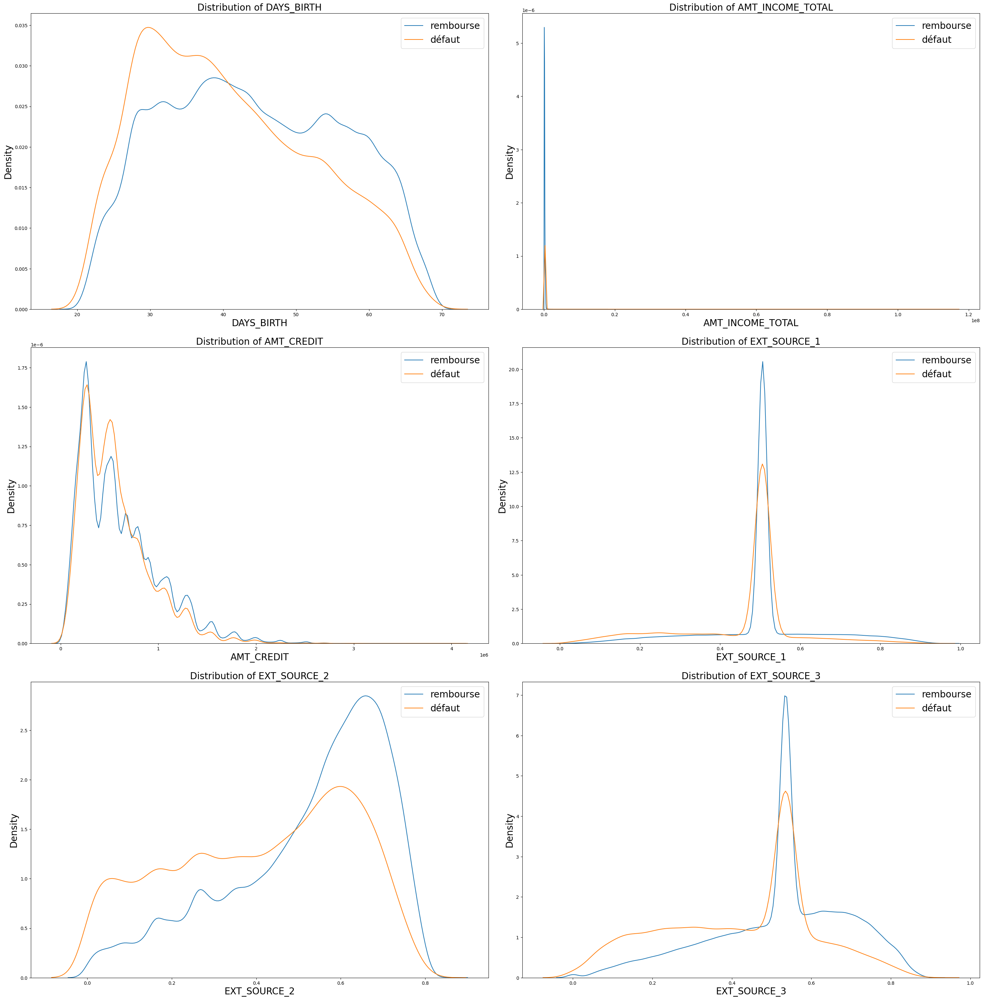

In [103]:
col_density = ['DAYS_BIRTH','AMT_INCOME_TOTAL', 'AMT_CREDIT', 
               'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']
distribution_densite(train_df,col_density,n_cols=2,nom='densite.pdf',fig=(30,40))

Il est observable que la distribution des clients en défaut de paiement est inclinée vers les tranches d’âge inférieures comparativement à celle des clients qui s’acquittent de leurs dettes, suggérant une propension des plus jeunes à se retrouver en situation de défaut. Pour la majorité des variables, les différences entre les deux groupes (ceux qui remboursent et ceux en défaut) ne sont pas significativesOn ne constate pas de grande différences entre les deux classes (rembourse ou défaut) pour la plupart des variables exceptées 'EXT_SOURCE_1', 'EXT_SOURCE_2' et 'EXT_SOURCE_3'. En effet, on peut constater que la classe représentant les clients en défaut semble être plus présente lorsque les valeurs pour ces variabels sont faibles, et inversement pour la seconde class

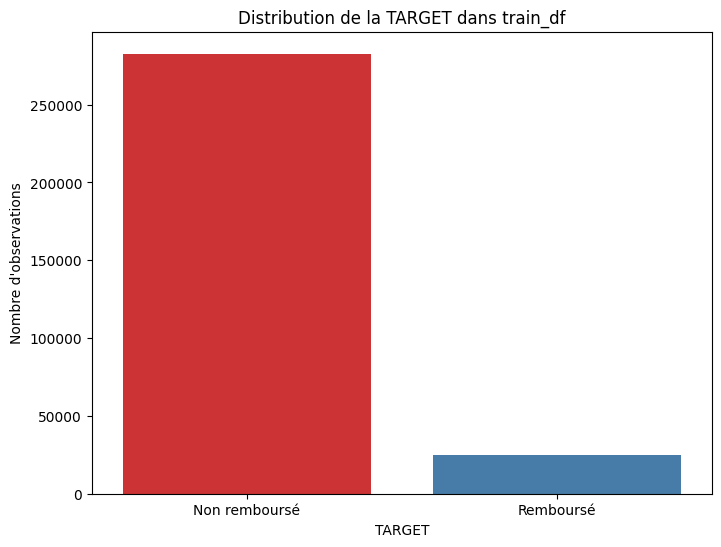

In [104]:
plt.figure(figsize=(8, 6))
sns.countplot(x='TARGET', data=train_df, palette='Set1')
plt.xlabel('TARGET')
plt.ylabel('Nombre d\'observations')
plt.title('Distribution de la TARGET dans train_df')
plt.xticks([0, 1], ['Non remboursé', 'Remboursé'])
plt.show()


Dans notre variable cible, la valeur 1 est attribuée aux clients rencontrant des problèmes de paiement (ceux qui ont accusé un retard de plus de X jours sur au moins une des Y premières mensualités du prêt dans notre échantillon), tandis que la valeur 0 est assignée aux clients sans difficultés de paiement.

Il est à noter que notre variable cible présente un déséquilibre. En effet, notre jeu de données contient une proportion bien plus élevée de clients sans problèmes de paiement.

Nous explorerons ultérieurement des méthodes pour rééquilibrer notre variable cible afin de faciliter la modélisation.

In [105]:
train_df.to_csv('train_df.csv', index = False)